# **Exploratory Data Analysis and Text Preprocessing**
### ***EDA***
* Plot Daily and Weekly Activity over time from r/India - *Scraped*
* Flair Distribution
* Post Word Count Analysis
* Text Sentiment Analysis
* Character Composition
* Word Clouds
* Word Clouds based on MultinomialNaiveBayes probabilities of TF IDF scores
 
### ***Text Preprocessing***
* Contraction Mapping
* HyperLink Removal
* Extra Space removal
* Character Composition
* Domain Features
* Lemmatization
* Spell Checks
 



## **Imports**

In [0]:
%%capture
#!git clone https://github.com/someshsingh22/FlaiReddit-MIDAS
#%cd FlaiReddit-MIDAS
#!wget https://www.kaggleusercontent.com/kf/31655789/eyJhbGciOiJkaXIiLCJlbmMiOiJBMTI4Q0JDLUhTMjU2In0..JbrDyJbyaVCxrQNFZnSjcg.WA-3WO9wiu_wpL9NotZmZdOat4DSvClS9JWJY-9n8epes73dt_vvd91RsyGnSOFE6-7GOpSNRRdaIW0a6blYSBgleFwOw-QiaCzcChVJB9p0obqxsrJ_j6h_6md-Kw-PWqLB150fuQZ50pQjuR69wXc7rFArvq_-g0uJUvPlJuTCrTg474ejwGY9r1G87p1ns7Tmo0Z7_WH121KXmsm2ujRJQ7VWud_TUGYTRsXTjd4cA7gxT28pyxRUZ9fC0O9aBGaZtCoJy72LaUlL2fqJzWYIIGEF-Jkk5NObvbl0hbQaI_h8nbg1hPhKUT0JcZV70z8mTXt_wRMdfNpQhOeMr3e6B_TGi8VUN9FlZ4YSl62tPlpmHZv2fAm7pcM5fVh5YbN4W5MEzuUi5-KsnxjZjknxO_m5yDeZ1dVeL-ra3fS2MqRL6YSywTUOEGkXBBrdoxIDZAPX9AzNpS2xpEeMlcZxoDsFRHguL9ps599hyJF2846mrqJDpAT7JBIOJx3dT9MZ7IinQERaG_JHNJ1s-KaH0ZdwFOazfYO_mUPECFiEv4ZV7PdAEFcqizAPNkorJeL7Yih5Tn65hSZQvAr7IJtvAHQjZ5smcOFXJs_QNogZJW8hsaVTYPgbDNgTNWLEChzxehdxfsHBVLztn-9yFWYRsBTHtu_KX873-xWQbjc.tV6a7n85asUlKemSPhuwjQ/raw_data.csv
#!wget https://www.kaggleusercontent.com/kf/31655789/eyJhbGciOiJkaXIiLCJlbmMiOiJBMTI4Q0JDLUhTMjU2In0..6Ze5qANB8amjU_VLq9NULg.XSMV5LiJbTYGSPpLrUeG1Fk_Ssca2StRfM3s5CX8kYx7pcNkVSiOac_uBPn-jaDnTSE_8AcyBDwQUlUOhCVWv7xWyneWYG94uY6lanMLYqhyNesgB6xmHNkLvSfDL4_Uib6uZCJaDZ6YyM9UjBNbJsXcXGB-8yHg0qxMSAeo6ADZ9Wr3cc09JdF1PWf-3H6orrWCL_J5gNEUKwSn0wcEJcjVnhA2wRmaQxkONhtao2BTwdmwZ-CwCdZueGK1uWqoJ25IIiWeOBMTXPs5q2ltHQfVaaiq_hrlb23BneZ8dZTj309WcyCPXFAjKbq7t5wjvwMI8FrBW1M4GnXPy_pHdjofJMrbzAZOFuBl27ra90ZOrNkIJcydmiU1e2w3YaWIGqY-9x1f5XHLm4f457DQMUyKf0uDKjfgZzgUbeclouplrdb16tE55dylP4ELthWK79_NAIUyvIqwB_HSQHId4OR7utFtKrGNGz_Y2e7uBGQ_KBooX2gLBH1YHrHwZ-mcSCJp8kn2SAlCeEtfkM-aEA95NlgE0OBcTJ7_w5qEzJj0EgFbH3ynBlYmFN_-jDhBAmNOwvBzzokUr6-PRXHJK1hngQ2XASeyKCxhbyP4Ietlu3YVZKFNK54YbAmxAhJ8wRCigKeYUY45vDLPZ3r28qS5AIEaCSxvut3Fw7T96mI.6ww6JcV32_qFXlnzBFxsiA/stats.pkl

from modules.crawler import * #for all imports
import re #for data exploration and cleaning
from collections import Counter #Frequency Calc
import string #String Lib
from scipy import sparse #Sparsed Vectorizers
import scipy.stats as ss 
from wordcloud import WordCloud ,STOPWORDS #WordClouds

#Basic NLP
import nltk 
from nltk.corpus import stopwords
import warnings
from textblob import TextBlob

#Vectorizers
from sklearn.feature_extraction.text import CountVectorizer as CV
from sklearn.feature_extraction.text import TfidfVectorizer as TF

#MNB Classifier Modelling
from sklearn.naive_bayes import MultinomialNB as MNB
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.utils import resample
import numpy as np
from scipy.sparse import hstack
from scipy import sparse

#Settings
nltk.download('stopwords')
start_time=time.time()
color = sns.color_palette()
sns.set_style("dark")
eng_stopwords = set(stopwords.words("english"))
warnings.filterwarnings("ignore")
%matplotlib inline

### **Load Data, Stats**
Load data and pickled stats from output of Crawler

In [0]:
raw_df=pd.read_csv(open('raw_data.csv'), encoding='utf-8').dropna() #Replace with data/raw_data.csv in offline mode
with open("stats.pkl",'rb') as f: #Replace with data/stats.pkl in offline mode
  x=pickle.load(f)
  post_count,post_date = [post[1] for post in x],[post[0] for post in x]

#### ***Reddit Daily Activity***
Let's plot date wise posts on r/india and compare with the plots available on subreddit stats Daily Activity on r/india can be viewed at : [subredditstats](https://subredditstats.com/r/india)

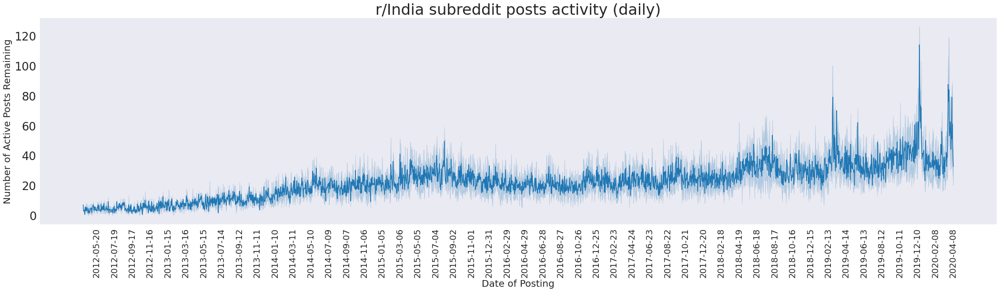

In [0]:
#@title
plt.figure(figsize=(36,8))
plt.title("r/India subreddit posts activity (daily)", fontsize=32)
plt.ylabel("Number of Active Posts Remaining", fontsize=20)
plt.xlabel("Date of Posting", fontsize=20)
plt.xticks(fontsize=18,rotation=90)
plt.yticks(fontsize=24,rotation=0)
g=sns.lineplot(y=post_count, x=post_date)
g.set(xticks=post_date[::120])
plt.show()

#### ***Reddit Weekly Activity***
On visualizing weekly activity, the uniformity over time is clear

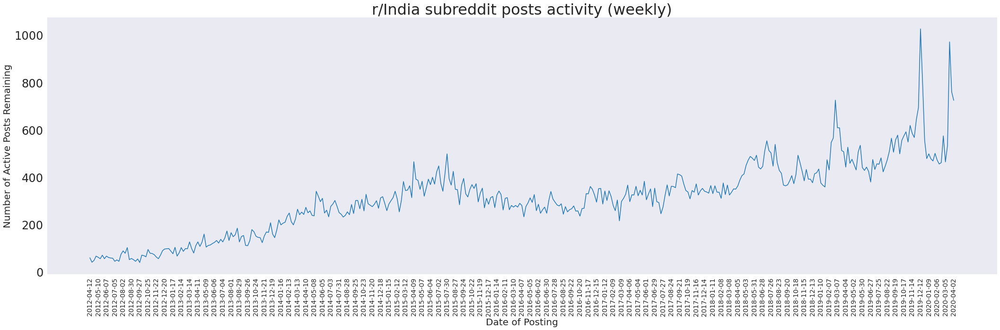

In [0]:
#@title
n=14
chunks_count = [post_count[i * n:(i + 1) * n] for i in range((len(post_count) + n - 1) // n )]
chunks_date = [post_date[i * n:(i + 1) * n] for i in range((len(post_date) + n - 1) // n )]
chunks_count=[sum(chunk) for chunk in chunks_count]
chunks_date=[chunk[-1] for chunk in chunks_date]

plt.figure(figsize=(36,10))
plt.title("r/India subreddit posts activity (weekly)", fontsize=32)
plt.ylabel("Number of Active Posts Remaining", fontsize=20)
plt.xlabel("Date of Posting", fontsize=20)
plt.xticks(fontsize=14,rotation=90)
plt.yticks(fontsize=24,rotation=0)
g=sns.lineplot(x=chunks_date[:-1], y=chunks_count[:-1])
g.set(xticks=chunks_date[:-1][::4])
plt.show()

#### ***Class Distribution***
The Data has been scraped across 8 years and it is visible only some of the flairs have been persistent and have not been deleted by the moderators or admins, due to lack of training data we will build our classifier on the flairs that have atleast 1000 samples after merging similar flairs and removinf deleted or removed content

Counter({'Non-Political': 35681, 'AskIndia': 33888, 'Politics': 13411, '[R]eddiquette': 5086, 'Scheduled': 1658, 'Policy/Economy': 1517, 'Science/Technology': 1402, 'Business/Finance': 1167, 'Coronavirus': 957, 'Demonetization': 756, 'Food': 587, 'Sports': 561, 'Net Neutrality': 438, 'Technology': 386, 'Policy': 353, 'Entertainment': 335, 'Science &amp; Technology': 253, 'AMA': 230, 'Photography': 135, 'Unverified': 128, 'CAA-NRC': 114, 'Askindia': 97, 'Moderated': 95, 'Casual': 73, 'Policy &amp; Economy': 55, 'Business &amp; Finance': 37, 'Misleading': 26, 'Governance': 24, 'Reddiquette Enforced': 24, 'Casual AMA': 22, 'Low-effort self-post.': 14, 'AMA Announcement': 5, '[Unverified]': 3, '[NSFNRI]': 3, 'Meta': 2, 'CAA-NRC-NPR': 2, 'Announcement': 2, 'Low-effort Self Post.': 2, 'Unverified Content.': 2, 'Megathread': 2, 'Cultural Exchange': 2, 'Repost.': 2, 'ಠ_ಠ': 2, 'Removed: Low-effort self-post': 2, '( ͡° ͜ʖ ͡°)': 2, '[OLD]': 2, '[Important!]': 2, 'Verified': 1, 'PARTAYYY AGAIN :D'

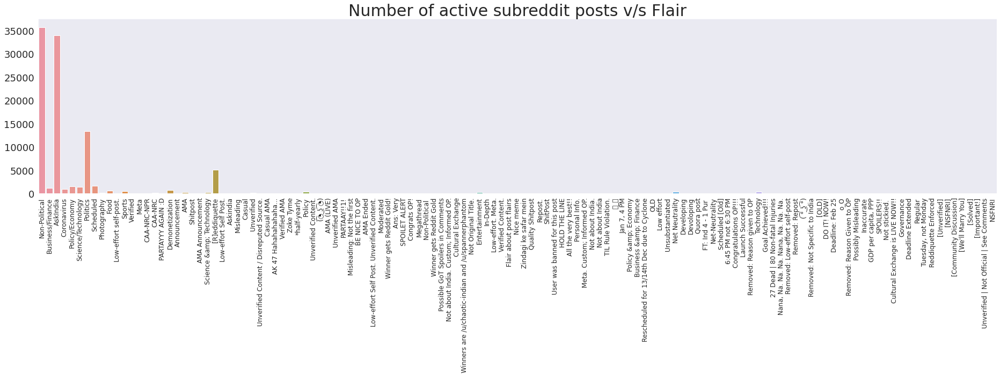

In [0]:
#@title
counter=Counter(raw_df['Flair'])
flair, freq = [],[]
for k,v in counter.items():
  flair.append(k)
  freq.append(v)
print(counter)
raw_df=raw_df[raw_df['Text'].apply(lambda x : x.count('[removed]')) == 0]
raw_df['Flair'].replace('Science &amp; Technology', 'Science/Technology', inplace=True)
raw_df['Flair'].replace('Policy &amp; Economy', 'Policy/Econonmy', inplace=True)
raw_df['Flair'].replace('Non-Political ', 'Non-Political', inplace=True)
raw_df['Flair'].replace('Askindia', 'AskIndia', inplace=True)
plt.figure(figsize=(32,6))
plt.title("Number of active subreddit posts v/s Flair", fontsize=30)
plt.xticks(fontsize=12,rotation=90)
plt.yticks(fontsize=18,rotation=0)
sns.barplot(x=flair, y=freq)
raw_df=raw_df[raw_df['Flair'].apply(lambda x : counter[x])>1000]

### ***Sentiment Analysis***
We will measure the polarity of each post's title and text

While text polarity is uniform, variance is observed in Title

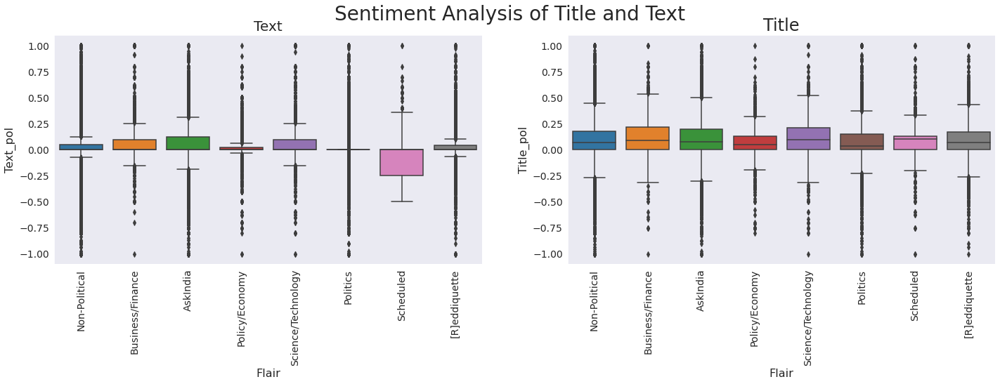

In [0]:
#@title
raw_df['Text_pol']=raw_df['Title'].apply(lambda x : TextBlob(x).sentiment.polarity)
raw_df['Title_pol']=raw_df['Text'].apply(lambda x : TextBlob(x).sentiment.polarity)

plt.figure(figsize=(24,6))
plt.suptitle("Sentiment Analysis of Title and Text", fontsize=28)
plt.subplot(121)
plt.title("Text", fontsize=20)
plt.ylabel("Number of Active Posts Remaining", fontsize=16)
plt.xlabel("Polarity", fontsize=16)
plt.xticks(fontsize=14,rotation=90)
plt.yticks(fontsize=14,rotation=0)
sns.boxplot(x="Flair", y='Text_pol', data=raw_df)
plt.subplot(122)
plt.title("Title", fontsize=24)
plt.ylabel("Number of Active Posts Remaining", fontsize=16)
plt.xlabel("Polarity", fontsize=16)
plt.xticks(fontsize=14,rotation=90)
plt.yticks(fontsize=14,rotation=0)
sns.boxplot(x="Flair", y='Title_pol', data=raw_df)

### ***Post Word Count Analysis***
Some variation is clear across the titles and texts, both

*Note : Text Lengths over 5000 and Title lengths over 200 have been discarded so that the plots arent skewed too much because of the outliers*

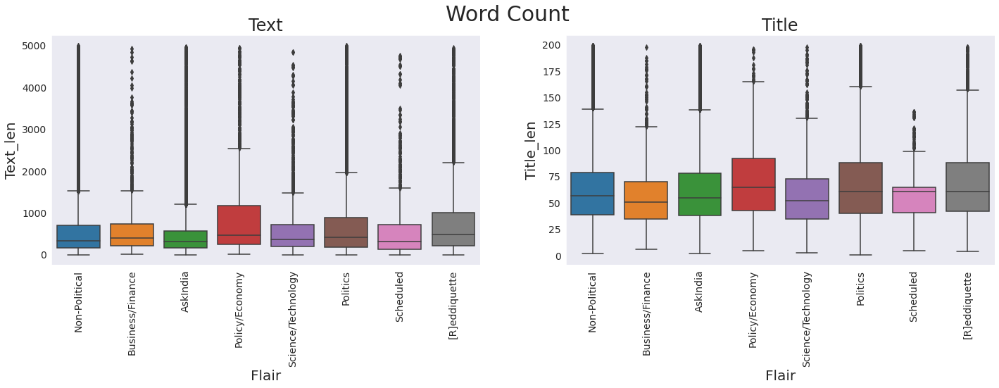

In [0]:
#@title
raw_df['Title_len']=raw_df['Title'].str.len()
raw_df['Text_len']=raw_df['Text'].str.len()

plt.figure(figsize=(24,6))
plt.suptitle("Word Count", fontsize=30)
plt.subplot(121)
plt.title("Text", fontsize=24)
plt.ylabel("Number of Active Posts Remaining", fontsize=20)
plt.xlabel("Number of Words", fontsize=20)
plt.xticks(fontsize=14,rotation=90)
plt.yticks(fontsize=14,rotation=0)
sns.boxplot(x="Flair", y='Text_len', data=raw_df[raw_df['Text_len']<5000])
plt.subplot(122)
plt.title("Title", fontsize=24)
plt.ylabel("Number of Active Posts Remaining", fontsize=20)
plt.xlabel("Number of Words", fontsize=20)
plt.xticks(fontsize=14,rotation=90)
plt.yticks(fontsize=14,rotation=0)
sns.boxplot(x="Flair", y='Title_len', data=raw_df[raw_df['Title_len']<200])

### ***Character Composition***
Considering the character composition we can see that there are a few posts in languages other than hindi and a few emojis as well, moreover ~82% of the data is only english characters, we also have different forms such as (bold) text, and italics.

We will remove the punctuations and numbers as well but we need to make sure we do not lose morphological significance

In [0]:
corpus=' '.join(raw_df['Text']).lower()
chars=Counter(corpus)
sorted(chars.items(), key=lambda i: i[1], reverse=True)
sum=0
for i in string.ascii_letters+string.punctuation+string.digits:
  sum+=chars[i]
print(100*sum/len(' '.join(raw_df['Text'])))

82.3585841392242


In [0]:
print(chars)

Counter({' ': 10450721, 'e': 5531998, 't': 4387276, 'a': 4115376, 'i': 3898297, 'o': 3741678, 'n': 3463620, 's': 3159237, 'r': 2773058, 'h': 2327542, 'l': 1946264, 'd': 1901306, 'c': 1442313, 'm': 1413850, 'u': 1395121, 'p': 1132810, 'g': 1065663, 'w': 1025221, 'y': 1015178, 'f': 956266, 'b': 779720, '.': 726990, '\n': 594700, 'v': 554609, 'k': 486319, ',': 381631, '-': 294341, '/': 293631, "'": 163466, '0': 141168, 'j': 128208, '1': 119703, '*': 118378, '?': 111889, '2': 108173, 'x': 104424, ':': 102936, ')': 99192, '(': 92227, '3': 61391, '_': 60725, '5': 59318, 'q': 53464, '4': 53286, ';': 53178, 'z': 45121, '9': 44749, '6': 42759, '"': 42534, '8': 41075, '&': 39468, '7': 39409, ']': 35814, '[': 35798, '=': 31390, '!': 27335, '’': 18696, '#': 15277, '%': 14769, '|': 13176, 'ा': 9238, '+': 9180, '\\': 8311, 'े': 6385, 'क': 6221, 'र': 5996, '^': 5301, '“': 5205, '”': 5182, 'ह': 4345, 'न': 4241, 'ी': 4070, '्': 4007, '\xa0': 3737, 'स': 3697, 'त': 3579, 'म': 3534, 'ं': 3403, 'ि': 3330, 

### ***Contractions and Domain Specific Text in data***
* We capture major contractions using regex, and then we club them on basis of their suffixes and create a custom map and remove other contractions by removing the apostrophes for rare cases
* Since the data is from Reddit there are mentions of subreddits \[r/\] and users \[u/\], which otherwise would be lost in the cleaning
* There are a lot of hyperlinks in the data, most hyperlinks have their context linked as \[context\]link
* Hashtags and markdown formats like &gt and &amp ; are present
 



In [0]:
contractions=Counter(re.findall("[a-z]+'[a-z]+", corpus))
print(sorted(contractions.items(), key=lambda i: i[1], reverse=True))
contractions=Counter(re.findall("[a-z]'[a-z]+", corpus))
print(sorted(contractions.items(), key=lambda i: i[1], reverse=True))
print(Counter(re.findall("r\/[a-z]+", corpus)).most_common(10))
print(Counter(re.findall("u\/[a-z]+", corpus)).most_common(10))
print(re.findall('\(*http[s]?://(?:[a-zA-Z]|[0-9]|[$-_@.&+#]|[!*\(\),]|(?:%[0-9a-fA-F][0-9a-fA-F]))*', corpus)[:10])
print(sorted(Counter(re.findall("#[a-z]+",corpus)).items(), key=lambda i: i[1], reverse=True)[:10])
print(Counter(re.findall("&[a-z;]+",corpus)).most_common(10))

[("don't", 20568), ("i'm", 20482), ("it's", 12730), ("i've", 7985), ("can't", 5925), ("didn't", 4976), ("doesn't", 4792), ("that's", 3273), ("i'll", 2947), ("isn't", 2859), ("i'd", 2590), ("won't", 2525), ("there's", 2359), ("what's", 2290), ("it'll", 2085), ("haven't", 1821), ("couldn't", 1814), ("let's", 1679), ("india's", 1608), ("you're", 1576), ("here's", 1463), ("wasn't", 1392), ("he's", 1370), ("they're", 1363), ("aren't", 1331), ("we're", 1121), ("wouldn't", 1089), ("shouldn't", 948), ("she's", 805), ("you'll", 593), ("hasn't", 570), ("we've", 518), ("who's", 511), ("modi's", 475), ("they've", 462), ("you've", 451), ("people's", 426), ("they'll", 396), ("today's", 378), ("we'll", 364), ("week's", 336), ("you'd", 330), ("weren't", 286), ("one's", 283), ("friend's", 257), ("world's", 248), ("father's", 246), ("government's", 228), ("country's", 216), ("dad's", 215), ("women's", 215), ("it'd", 208), ("he'll", 200), ("bjp's", 198), ("mother's", 188), ("hadn't", 186), ("how's", 179)

### ***Data Cleaning***
* We will also remove very long texts for models which need fixed length of sequences while not losing more than 5-6 % of data
* A lot of texts were simple whitespaces / links which provide no context for training therefore we will remove samples with text less than 4 words

In [0]:
contracts={
  "n't" : " not",
  "'ll" : "will",
  "'ve" : "have",
  "'n" : "",
  "'ed" : "",
  "'l" : "will",
  "'re" : "are",
  "'r" : "are",
  "'a" : " is a",
  "'d" : "had",
  "'ing" : "ing",
  "r\/" : " subreddit ",
  "u\/" : " user ",
  "&amp;" : " ",
  "&gt;" : " ",
  "&lt;" : " ",
  "&gt" : "  ",
  "&lt" : " ",
  "#" : "#  ",}
def clean(text):
  text=text.lower()
  text=text.replace('\n', ' ')
  for k,v in contracts.items():
    text=text.replace(k,v)
  text=re.sub('[(]?http[s]?://(?:[a-zA-Z]|[0-9]|[$-_@.&+#]|[!*\(\),]|(?:%[0-9a-fA-F][0-9a-fA-F])/)*', ' ', text)
  text=re.sub('[^a-z]', ' ', text)
  text=' '.join([word for word in text.split(' ') if not word== ''])
  return text
raw_df['Text']=raw_df['Text'].apply(lambda x : clean(x))

* We drop text less than 4 words and all lengths greater than 500 as we can see that a majority of data is under 500 words and fall drastically with loss of less than 0.1% data

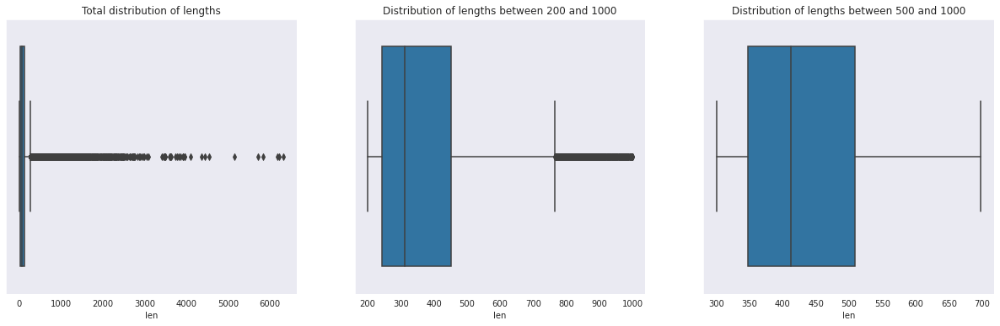

In [0]:
#@title
raw_df['len']=raw_df['Text'].str.split(' ').apply(lambda x : len(x))
plt.figure(figsize=(21,6))
plt.subplot(131)
plt.title("Total distribution of lengths")
sns.boxplot(raw_df['len'])
plt.subplot(132)
plt.title("Distribution of lengths between 200 and 1000")
sns.boxplot(raw_df[raw_df['len'].apply(lambda x : (x<1000 and x>200))]['len'])
plt.subplot(133)
plt.title("Distribution of lengths between 500 and 1000")
sns.boxplot(raw_df[raw_df['len'].apply(lambda x : (x<700 and x>300))]['len'])
raw_df=raw_df[raw_df['len']<500]
raw_df=raw_df[raw_df['len']>2]

### ***Word Cloud***
Let us visualize the frequently appearing words in the text and title in the entire dataset.

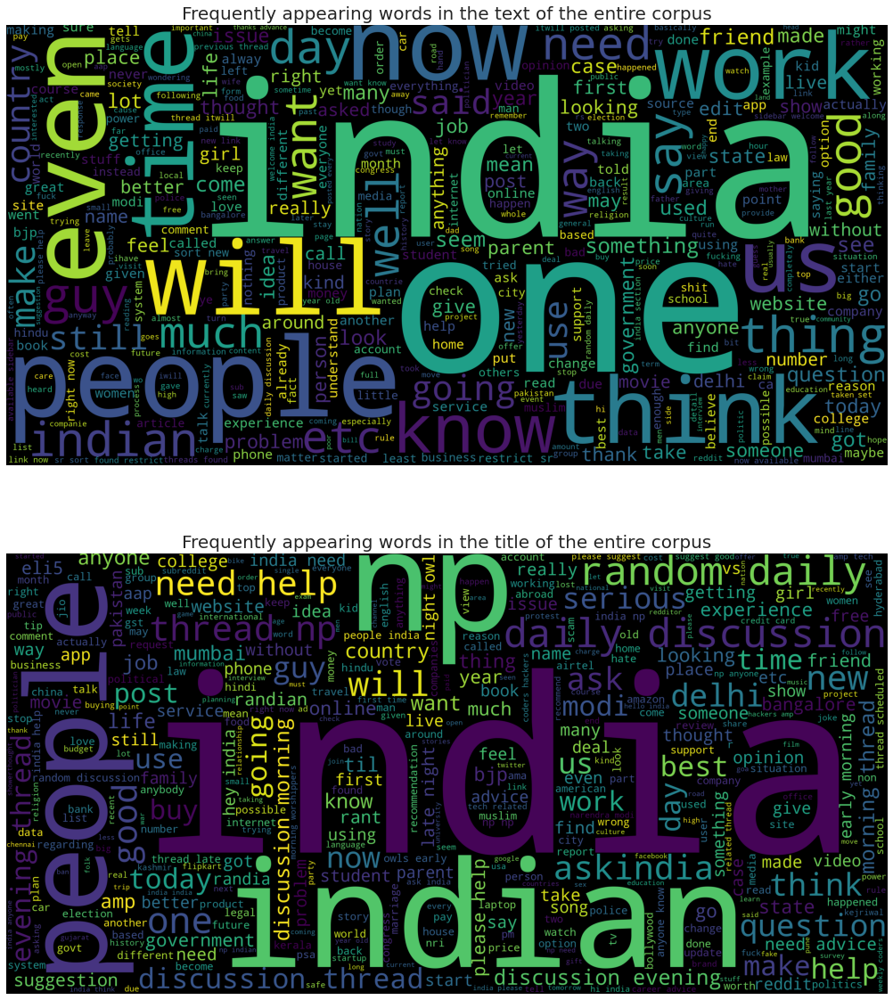

In [0]:
#@title
text=raw_df.Text.values
title=raw_df.Title.str.lower().values
plt.figure( figsize=(20,20))
plt.subplot(211)
plt.title("Frequently appearing words in the text of the entire corpus", fontsize=20)
wc= WordCloud(background_color="black",max_words=400,stopwords=STOPWORDS, width=3200, height=1600)
wc.generate(" ".join(text))
plt.imshow(wc)
plt.axis("off")

plt.subplot(212)
plt.title("Frequently appearing words in the title of the entire corpus", fontsize=20)
wc= WordCloud(background_color="black",max_words=400,stopwords=STOPWORDS, width=3200, height=1600)
wc.generate(" ".join(title))
plt.imshow(wc)
plt.axis("off")

plt.show()

### ***Final distribution of Flairs***
The distribution of all flairs after claeaning and removing unnecessary samples

In [0]:
#@title
del raw_df['len']
raw_df.to_csv("data/data.csv",index=False)
del raw_df
df=pd.read_csv("data/data.csv")

Counter({'Non-Political': 33373, 'AskIndia': 33163, 'Politics': 12245, '[R]eddiquette': 4721, 'Science/Technology': 1537, 'Scheduled': 1532, 'Policy/Economy': 1298, 'Business/Finance': 1090})


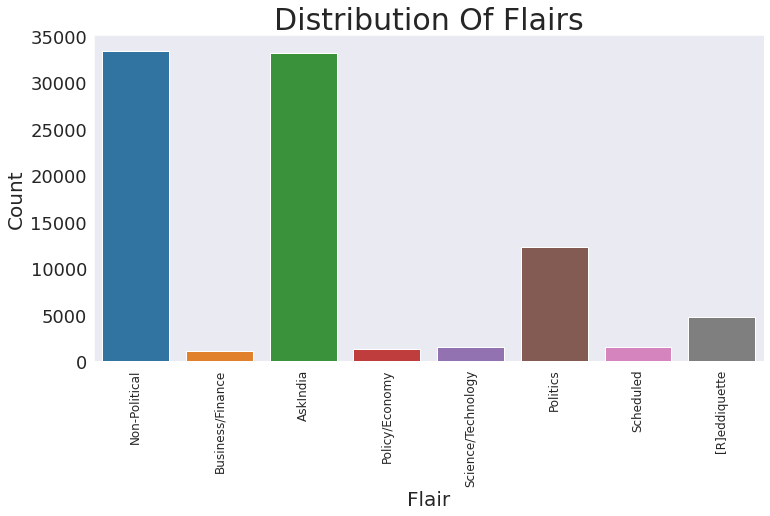

In [0]:
#@title
counter=Counter(df['Flair'])
flair, freq = [],[]
for k,v in counter.items():
  flair.append(k)
  freq.append(v)
print(counter)
plt.figure(figsize=(12,6))
plt.title("Distribution Of Flairs", fontsize=30)
plt.xlabel("Flair", fontsize=20)
plt.ylabel("Count", fontsize=20)
plt.xticks(fontsize=12,rotation=90)
plt.yticks(fontsize=18,rotation=0)
sns.barplot(x=flair, y=freq)

### ***Word Clouds***
Let us visualize word importance by plotting wordplots of title and text across the different flairs
 
On plotting the real text frequency discriminative features are not visible due to words which are present across all subreddits, to get words with discriminative power for classification we will plot word clouds based on TF IDF-BOW's Multinomial Naive Bayes probabilities 

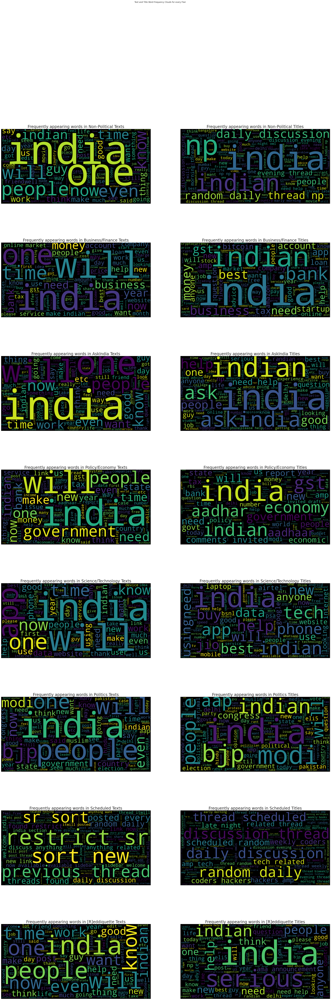

In [0]:
#@title
sub=821
plt.figure( figsize=(36,100))
plt.suptitle("Text and Title Word Frequency Clouds for every Flair")
for i,f in enumerate(flair):
  text=df[df['Flair']==f].Text.str.lower().values
  title=df[df['Flair']==f].Title.str.lower().values

  wc= WordCloud(background_color="black",max_words=200,stopwords=STOPWORDS, width=1600, height=800, collocations=True)
  wc.generate(" ".join(text))
  plt.subplot(8,2,(2*i)+1)
  plt.axis("off")
  plt.title("Frequently appearing words in {} Texts".format(f), fontsize=24)
  plt.imshow(wc)

  wc= WordCloud(background_color="black",max_words=200,stopwords=STOPWORDS, width=1600, height=800, collocations=True)
  wc.generate(" ".join(title))
  plt.subplot(8,2,(2*i)+2)
  plt.axis("off")
  plt.title("Frequently appearing words in {} Titles".format(f), fontsize=24)
  plt.imshow(wc)
plt.show()

### ***RESAMPLING OF DATA***
* To ensure a balanced dataset flairs have been upsampled and sub-sampled according to their proportion to get the same number of training points for all flairs
* TF IDF Scores for all unigrams are calculate and fed to a Bag-Of-Word
* The multinomial naive bayes log probabilty for each word is obtained and fed as weight to the Word Cloud

In [0]:
#UNDERSAMPLE
f_df={k:df[df['Flair']==k] for k in set(df['Flair'])}
train_df=pd.concat([resample(data[100:], n_samples=22700, replace=True, random_state=123) for data in f_df.values()])
valid_df=pd.concat([data[:100] for data in f_df.values()])

In [0]:
cv=TF(sublinear_tf=True,min_df=10, encoding='latin-1',ngram_range=(1,1),stop_words='english', analyzer='word', max_features=6150)
cv.fit(df['Title']+' '+df['Text'])
train_data=hstack((cv.transform(train_df['Title']),cv.transform(train_df['Text'])))
valid_data=hstack((cv.transform(valid_df['Title']),cv.transform(valid_df['Text'])))
model= MNB()
model.fit(train_data, train_df['Flair'])

MultinomialNB(alpha=1.0, class_prior=None, fit_prior=True)

**Evaluating the model to show how much each tfidf contributes to a particular task**

In [0]:
#@title
rep=classification_report(y_pred=model.predict(valid_data), y_true=valid_df['Flair'])
print(rep)

                    precision    recall  f1-score   support

          AskIndia       0.29      0.43      0.35       100
  Business/Finance       0.56      0.54      0.55       100
     Non-Political       0.29      0.23      0.26       100
    Policy/Economy       0.64      0.45      0.53       100
          Politics       0.52      0.73      0.61       100
         Scheduled       0.89      0.89      0.89       100
Science/Technology       0.51      0.49      0.50       100
     [R]eddiquette       0.21      0.14      0.17       100

          accuracy                           0.49       800
         macro avg       0.49      0.49      0.48       800
      weighted avg       0.49      0.49      0.48       800



In [0]:
word_probs_tit=dict()
word_probs_tex=dict()
flair_prob_tex=dict()
flair_prob_tit=dict()
for word, code in cv.vocabulary_.items():
  word_probs_tit[word]=(2**model.feature_log_prob_)[:, code]
  word_probs_tex[word]=(2**model.feature_log_prob_)[:, code+cv.max_features]
for ind, flair in enumerate(model.classes_):
  flair_prob_tex[flair]={word:word_probs_tex[word][ind] for word in word_probs_tex.keys()}
  flair_prob_tit[flair]={word:word_probs_tit[word][ind] for word in word_probs_tit.keys()}

**Finally we can observe some relevant terms that indicate the possibility of each flair**

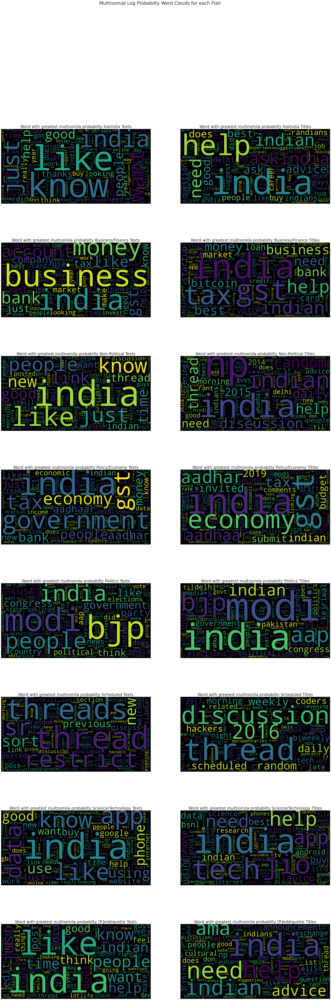

In [0]:
plt.figure( figsize=(36,100))
sub=821
plt.suptitle("Multinomial Log Probabilty Word Clouds for each Flair", fontsize=28)
for i,f in enumerate(model.classes_):
  text=df[df['Flair']==f].Text.str.lower().values
  title=df[df['Flair']==f].Title.str.lower().values
  plt.subplot(8,2,(2*i)+1)
  wc= WordCloud(background_color="black",max_words=200,stopwords=STOPWORDS, width=1600, height=800, collocations=True)
  wc.generate_from_frequencies(flair_prob_tex[f])
  plt.axis("off")
  plt.title("Word with greatest multnomila probabilty {} Texts".format(f), fontsize=24)
  plt.imshow(wc)

  plt.subplot(8,2,(2*i)+2)
  wc= WordCloud(background_color="black",max_words=200,stopwords=STOPWORDS, width=1600, height=800, collocations=True)
  wc.generate_from_frequencies(flair_prob_tit[f])
  plt.axis("off")
  plt.title("Word with greatest multnomila probabilty {} Titles".format(f), fontsize=24)
  plt.imshow(wc)
plt.show()

### ***Conclusion***
Clearly we can see that some words serve as indicators while some flairs are dependent on their lexical features, while low F-1 Scores for some flairs indicate lack of information based on Bag-Of-Words

While Shifting to Neural Networks and Deeper Strategies we will have to account for these relevant words and lexical features